In [52]:
import pandas as pd
import deepchem as dc

import pandas as pd

from tqdm import tqdm

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

from sklearn.linear_model import LinearRegression
from sklearn import svm
from sklearn.linear_model import SGDClassifier
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE


In [16]:
df_bbbp = pd.read_csv('./data/BBBP.csv')
df_bbbp.X = df_bbbp.X.apply(lambda x: [eval(n) for n in x[1:-1].split()])

X_train, X_test, y_train, y_test = train_test_split(list(df_bbbp.X), list(df_bbbp.y), test_size=0.1, random_state=0)

LR = svm.SVC(kernel='linear', probability=True)
LR.fit(np.array(X_train)[:, :47], np.array(y_train))
print(LR.score(np.array(X_test)[:, :47], np.array(y_test)))

LR = svm.SVC(kernel='linear', probability=True)
LR.fit(np.array(X_train)[:, 47:], np.array(y_train))
print(LR.score(np.array(X_test)[:, 47:], np.array(y_test)))

LR = svm.SVC(kernel='linear', probability=True)
LR.fit(np.array(X_train), np.array(y_train))
print(LR.score(np.array(X_test), np.array(y_test)))


0.8676470588235294
0.9264705882352942
0.9264705882352942


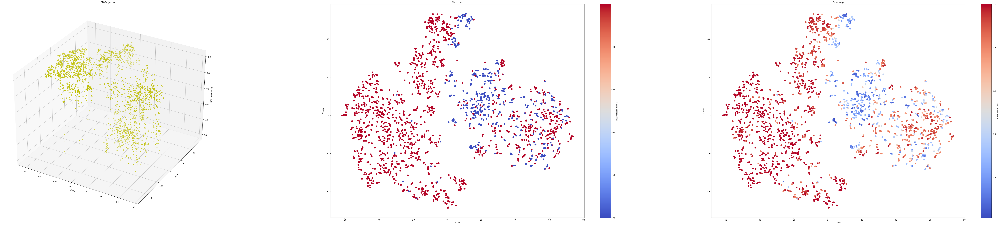

In [20]:
LR = svm.SVC(kernel='linear', probability=True)
LR.fit(np.array(X_train)[:, 47:], np.array(y_train))

bbbp_ftr = pd.DataFrame({
    'Smiles': [list(x[47:]) for x in df_bbbp.X],
    'Atomic': [list(x[:47]) for x in df_bbbp.X],
    'Predicted': [x[1] for x in LR.predict_proba([x[47:] for x in df_bbbp.X])],
    'label': list(df_bbbp.y)
})

#Draw figure with two subplot

tsne = TSNE(n_components=2, random_state=42)
transformed_data = tsne.fit_transform(np.array(list(bbbp_ftr.Smiles)))

fig = plt.figure(figsize=(100, 20))

ax1 = fig.add_subplot(1, 3, 1, projection='3d')

ax1.scatter(transformed_data[:, 0], transformed_data[:, 1], bbbp_ftr.Predicted, c='y')

ax1.set_title('3D-Projection')
ax1.set_xlabel('X-axis')
ax1.set_ylabel('Y-axis')
ax1.set_zlabel('BBBP Prediction')

ax2 = fig.add_subplot(1, 3, 2)

# 通过颜色表示第三个维度
sc = ax2.scatter(transformed_data[:, 0], transformed_data[:, 1], c=bbbp_ftr.label, cmap='coolwarm', s=60,
                 )

# 添加颜色条
colorbar = fig.colorbar(sc, ax=ax2)
colorbar.set_label('BBBP Measurement')

# 设置坐标轴标签
ax2.set_title('Colormap')
ax2.set_xlabel('X-axis')
ax2.set_ylabel('Y-axis')

ax3 = fig.add_subplot(1, 3, 3)

# 通过颜色表示第三个维度
sc = ax3.scatter(transformed_data[:, 0], transformed_data[:, 1], c=bbbp_ftr.Predicted, cmap='coolwarm', s=60,
                 )

# 添加颜色条
colorbar = fig.colorbar(sc, ax=ax3)
colorbar.set_label('BBBP Prediction')

# 设置坐标轴标签
ax3.set_title('Colormap')
ax3.set_xlabel('X-axis')
ax3.set_ylabel('Y-axis')

# 显示图形
plt.show()

In [21]:
df_delaney = pd.read_csv('./data/Delaney.csv')
df_delaney.X = df_delaney.X.apply(lambda x: [eval(n) for n in x[1:-1].split()])

X_train, X_test, y_train, y_test = train_test_split(list(df_delaney.X), list(df_delaney.y), test_size=0.1,
                                                    random_state=0)

LR = svm.SVR(kernel='linear')
LR.fit(np.array(X_train)[:, :47], np.array(y_train))
print(LR.score(np.array(X_test)[:, :47], np.array(y_test)))

LR = svm.SVR(kernel='linear')
LR.fit(np.array(X_train)[:, 47:], np.array(y_train))
print(LR.score(np.array(X_test)[:, 47:], np.array(y_test)))

LR = svm.SVR(kernel='linear')
LR.fit(np.array(X_train), np.array(y_train))
print(LR.score(np.array(X_test), np.array(y_test)))

0.7872801725029969
0.8299124458131584
0.8368949826085342


0.8299124458131584


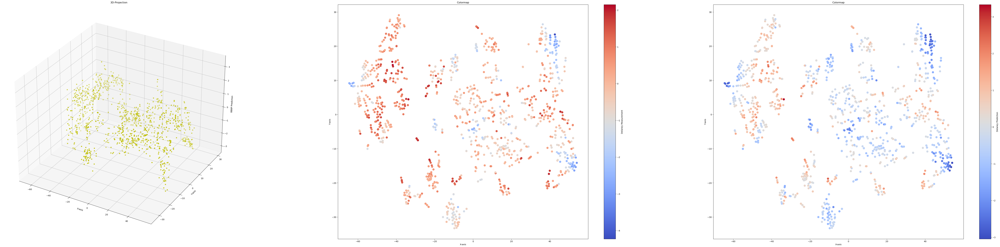

In [23]:
LR = svm.SVR(kernel='linear')
LR.fit(np.array(X_train)[:, 47:], np.array(y_train))
print(LR.score(np.array(X_test)[:, 47:], np.array(y_test)))

delany_ftr = pd.DataFrame({
    'Smiles': [list(x[47:]) for x in df_delaney.X],
    'Atomic': [list(x[:47]) for x in df_delaney.X],
    'Predicted': [x for x in LR.predict([x[47:] for x in df_delaney.X])],
    'label': list(df_delaney.y)
})

#Draw figure with two subplot

tsne = TSNE(n_components=2, random_state=42)
transformed_data = tsne.fit_transform(np.array(list(delany_ftr.Smiles)))

fig = plt.figure(figsize=(90, 20))

ax1 = fig.add_subplot(1, 3, 1, projection='3d')

ax1.scatter(transformed_data[:, 0], transformed_data[:, 1], delany_ftr.Predicted, c='y')

ax1.set_title('3D-Projection')
ax1.set_xlabel('X-axis')
ax1.set_ylabel('Y-axis')
ax1.set_zlabel('BBBP Prediction')

ax2 = fig.add_subplot(1, 3, 2)

# 通过颜色表示第三个维度
sc = ax2.scatter(transformed_data[:, 0], transformed_data[:, 1], c=delany_ftr.label, cmap='coolwarm', s=80,
                 )

# 添加颜色条
colorbar = fig.colorbar(sc, ax=ax2)
colorbar.set_label('Delaney Measurement')

# 设置坐标轴标签
ax2.set_title('Colormap')
ax2.set_xlabel('X-axis')
ax2.set_ylabel('Y-axis')

ax2 = fig.add_subplot(1, 3, 3)

# 通过颜色表示第三个维度
sc = ax2.scatter(transformed_data[:, 0], transformed_data[:, 1], c=delany_ftr.Predicted, cmap='coolwarm', s=80,
                 )

# 添加颜色条
colorbar = fig.colorbar(sc, ax=ax2)
colorbar.set_label('Delaney Prediction')

# 设置坐标轴标签
ax2.set_title('Colormap')
ax2.set_xlabel('X-axis')
ax2.set_ylabel('Y-axis')

# 显示图形
plt.show()

In [31]:
df_sampl = pd.read_csv('./data/Sampl.csv')
df_sampl.X = df_sampl.X.apply(lambda x: [eval(n) for n in x[1:-1].split()])

X_train, X_test, y_train, y_test = train_test_split(list(df_sampl.X), list(df_sampl.y), test_size=0.1, random_state=0)

LR = svm.SVR(kernel='linear')
LR.fit(np.array(X_train)[:, :47], np.array(y_train))
print(LR.score(np.array(X_test)[:, :47], np.array(y_test)))

LR = svm.SVR(kernel='linear')
LR.fit(np.array(X_train)[:, 47:], np.array(y_train))
print(LR.score(np.array(X_test)[:, 47:], np.array(y_test)))

LR = svm.SVR(kernel='linear')
LR.fit(np.array(X_train), np.array(y_train))
print(LR.score(np.array(X_test), np.array(y_test)))

0.47459092311506434
0.7741056799182887
0.7734179293624963


0.7741056799182887


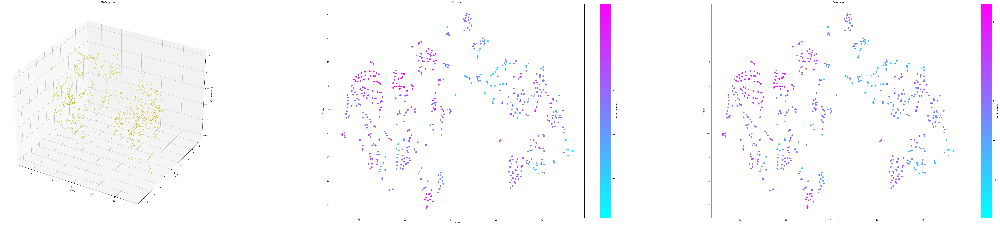

In [36]:
LR = svm.SVR(kernel='linear')
LR.fit(np.array(X_train)[:, 47:], np.array(y_train))
print(LR.score(np.array(X_test)[:, 47:], np.array(y_test)))

sampl_ftr = pd.DataFrame({
    'Smiles': [list(x[47:]) for x in df_sampl.X],
    'Atomic': [list(x[:47]) for x in df_sampl.X],
    'Predicted': [x for x in LR.predict([x[47:] for x in df_sampl.X])],
    'label': list(df_sampl.y)
})

sampl_ftr = sampl_ftr[(sampl_ftr.label > -3) & (sampl_ftr.label < 2)]

#sampl_ftr=sampl_ftr[(sampl_ftr.label>-2)&(sampl_ftr.label<-2)]
#Draw figure with two subplot

tsne = TSNE(n_components=2, random_state=42)
transformed_data = tsne.fit_transform(np.array(list(sampl_ftr.Smiles)))

fig = plt.figure(figsize=(100, 20))

ax1 = fig.add_subplot(1, 3, 1, projection='3d')

ax1.scatter(transformed_data[:, 0], transformed_data[:, 1], sampl_ftr.label, c='y')

ax1.set_title('3D-Projection')
ax1.set_xlabel('X-axis')
ax1.set_ylabel('Y-axis')
ax1.set_zlabel('BBBP Prediction')

ax2 = fig.add_subplot(1, 3, 2)

# 通过颜色表示第三个维度
sc = ax2.scatter(transformed_data[:, 0], transformed_data[:, 1], c=sampl_ftr.label, cmap='cool', s=60,
                 )

colorbar = fig.colorbar(sc, ax=ax2)
colorbar.set_label('Lipo Measurement')

# 设置坐标轴标签
ax2.set_title('Colormap')
ax2.set_xlabel('X-axis')
ax2.set_ylabel('Y-axis')

ax3 = fig.add_subplot(1, 3, 3)

# 通过颜色表示第三个维度
sc = ax3.scatter(transformed_data[:, 0], transformed_data[:, 1], c=sampl_ftr.Predicted, cmap='cool', s=60,
                 )

# 添加颜色条
colorbar = fig.colorbar(sc, ax=ax3)
colorbar.set_label('Sampl Prediction')

# 设置坐标轴标签
ax3.set_title('Colormap')
ax3.set_xlabel('X-axis')
ax3.set_ylabel('Y-axis')

# 显示图形
plt.show()

In [37]:
df_lipo = pd.read_csv('./data/Lipo.csv')
df_lipo.X = df_lipo.X.apply(lambda x: [eval(n) for n in x[1:-1].split()])

X_train, X_test, y_train, y_test = train_test_split(list(df_lipo.X), list(df_lipo.y), test_size=0.1, random_state=0)

LR = svm.SVR(kernel='linear')
LR.fit(np.array(X_train)[:, :47], np.array(y_train))
print(LR.score(np.array(X_test)[:, :47], np.array(y_test)))

LR = svm.SVR(kernel='linear')
LR.fit(np.array(X_train)[:, 47:], np.array(y_train))
print(LR.score(np.array(X_test)[:, 47:], np.array(y_test)))

LR = svm.SVR(kernel='linear')
LR.fit(np.array(X_train), np.array(y_train))
print(LR.score(np.array(X_test), np.array(y_test)))

0.19680165013910367
0.5119276966308819
0.501252784354311


0.5119276966308819


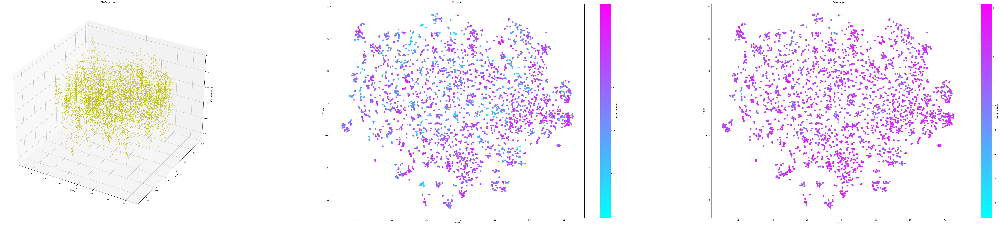

In [39]:
LR = svm.SVR(kernel='linear')
LR.fit(np.array(X_train)[:, 47:], np.array(y_train))
print(LR.score(np.array(X_test)[:, 47:], np.array(y_test)))

lipo_ftr = pd.DataFrame({
    'Smiles': [list(x[47:]) for x in df_lipo.X],
    'Atomic': [list(x[:47]) for x in df_lipo.X],
    'Predicted': [x for x in LR.predict([x[47:] for x in df_lipo.X])],
    'label': list(df_lipo.y)
})

#sampl_ftr=sampl_ftr[(sampl_ftr.label>-3) & (sampl_ftr.label<2)]

#Draw figure with two subplot

tsne = TSNE(n_components=2, random_state=42)
transformed_data = tsne.fit_transform(np.array(list(lipo_ftr.Smiles)))

fig = plt.figure(figsize=(100, 20))

ax1 = fig.add_subplot(1, 3, 1, projection='3d')

ax1.scatter(transformed_data[:, 0], transformed_data[:, 1], lipo_ftr.label, c='y')

ax1.set_title('3D-Projection')
ax1.set_xlabel('X-axis')
ax1.set_ylabel('Y-axis')
ax1.set_zlabel('BBBP Prediction')

ax2 = fig.add_subplot(1, 3, 2)

# 通过颜色表示第三个维度
sc = ax2.scatter(transformed_data[:, 0], transformed_data[:, 1], c=lipo_ftr.label, cmap='cool', s=60,
                 )

colorbar = fig.colorbar(sc, ax=ax2)
colorbar.set_label('Lipo Measurement')

# 设置坐标轴标签
ax2.set_title('Colormap')
ax2.set_xlabel('X-axis')
ax2.set_ylabel('Y-axis')

ax3 = fig.add_subplot(1, 3, 3)

# 通过颜色表示第三个维度
sc = ax3.scatter(transformed_data[:, 0], transformed_data[:, 1], c=lipo_ftr.Predicted, cmap='cool', s=60,
                 )

# 添加颜色条
colorbar = fig.colorbar(sc, ax=ax3)
colorbar.set_label('Lipo Prediction')

# 设置坐标轴标签
ax3.set_title('Colormap')
ax3.set_xlabel('X-axis')
ax3.set_ylabel('Y-axis')

# 显示图形
plt.show()

In [40]:
df_tox21 = pd.read_csv('./data/Tox21.csv')
df_tox21.X = df_tox21.X.apply(lambda x: [eval(n) for n in x[1:-1].split()])

X_train, X_test, y_train, y_test = train_test_split(list(df_tox21.X), list(df_tox21.y), test_size=0.1, random_state=0)

LR = svm.SVC(kernel='linear')
LR.fit(np.array(X_train)[:, :47], np.array(y_train))
print(LR.score(np.array(X_test)[:, :47], np.array(y_test)))

LR = svm.SVC(kernel='linear')
LR.fit(np.array(X_train)[:, 47:], np.array(y_train))
print(LR.score(np.array(X_test)[:, 47:], np.array(y_test)))

LR = svm.SVC(kernel='linear')
LR.fit(np.array(X_train), np.array(y_train))
print(LR.score(np.array(X_test), np.array(y_test)))

0.9597780859916782
0.9680998613037448
0.9680998613037448


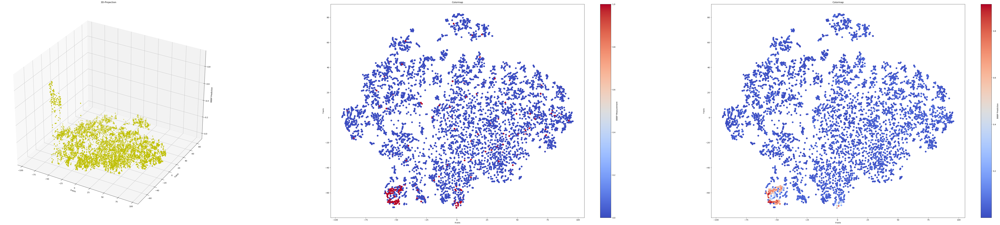

In [41]:
LR = svm.SVC(kernel='linear', probability=True)
LR.fit(np.array(X_train)[:, 47:], np.array(y_train))

tox21_ftr = pd.DataFrame({
    'Smiles': [list(x[47:]) for x in df_tox21.X],
    'Atomic': [list(x[:47]) for x in df_tox21.X],
    'Predicted': [x[1] for x in LR.predict_proba([x[47:] for x in df_tox21.X])],
    'label': list(df_tox21.y)
})

#Draw figure with two subplot

tsne = TSNE(n_components=2, random_state=42)
transformed_data = tsne.fit_transform(np.array(list(tox21_ftr.Smiles)))

fig = plt.figure(figsize=(100, 20))

ax1 = fig.add_subplot(1, 3, 1, projection='3d')

ax1.scatter(transformed_data[:, 0], transformed_data[:, 1], tox21_ftr.Predicted, c='y')

ax1.set_title('3D-Projection')
ax1.set_xlabel('X-axis')
ax1.set_ylabel('Y-axis')
ax1.set_zlabel('BBBP Prediction')

ax2 = fig.add_subplot(1, 3, 2)

# 通过颜色表示第三个维度
sc = ax2.scatter(transformed_data[:, 0], transformed_data[:, 1], c=tox21_ftr.label, cmap='coolwarm', s=60,
                 )

# 添加颜色条
colorbar = fig.colorbar(sc, ax=ax2)
colorbar.set_label('BBBP Measurement')

# 设置坐标轴标签
ax2.set_title('Colormap')
ax2.set_xlabel('X-axis')
ax2.set_ylabel('Y-axis')

ax3 = fig.add_subplot(1, 3, 3)

# 通过颜色表示第三个维度
sc = ax3.scatter(transformed_data[:, 0], transformed_data[:, 1], c=tox21_ftr.Predicted, cmap='coolwarm', s=60,
                 )

# 添加颜色条
colorbar = fig.colorbar(sc, ax=ax3)
colorbar.set_label('BBBP Prediction')

# 设置坐标轴标签
ax3.set_title('Colormap')
ax3.set_xlabel('X-axis')
ax3.set_ylabel('Y-axis')

# 显示图形
plt.show()

In [60]:
df_toxcast = pd.read_csv('./data/Toxcast.csv')
df_toxcast.X = df_toxcast.X.apply(lambda x: [eval(n) for n in x[1:-1].split()])

X_train, X_test, y_train, y_test = train_test_split(list(df_toxcast.X), list(df_toxcast.y), test_size=0.1,
                                                    random_state=0)

LR = SGDClassifier(loss="modified_huber")
LR.fit(np.array(X_train)[:, :47], np.array(y_train))
print(LR.score(np.array(X_test)[:, :47], np.array(y_test)))

LR = SGDClassifier(loss="modified_huber")
LR.fit(np.array(X_train)[:, 47:], np.array(y_train))
print(LR.score(np.array(X_test)[:, 47:], np.array(y_test)))

LR = SGDClassifier(loss="modified_huber")
LR.fit(np.array(X_train), np.array(y_train))
print(LR.score(np.array(X_test), np.array(y_test)))

0.6555819477434679
0.9513064133016627
0.9513064133016627


(array([7983.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
         429.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

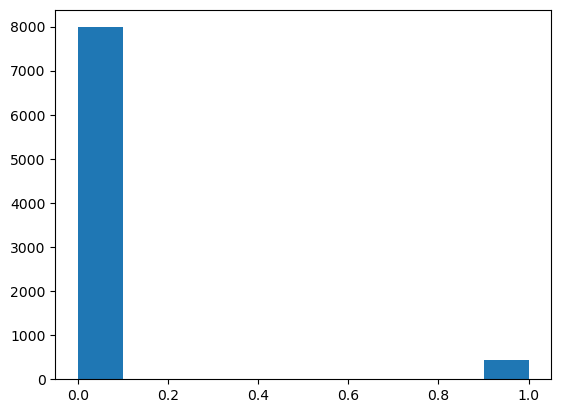

In [57]:
LR = SGDClassifier(loss="modified_huber")
LR.fit(np.array(X_train)[:, 47:], np.array(y_train))

df_toxcast = pd.DataFrame({
    'Smiles': [list(x[47:]) for x in df_toxcast.X],
    'Atomic': [list(x[:47]) for x in df_toxcast.X],
    'Predicted': [x[1] for x in LR.predict_proba([x[47:] for x in df_toxcast.X])],
    'label': list(df_toxcast.y)
})
plt.hist(df_toxcast.label)

(array([7917.,   96.,   69.,   76.,   73.,   39.,   42.,   21.,   16.,
          63.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

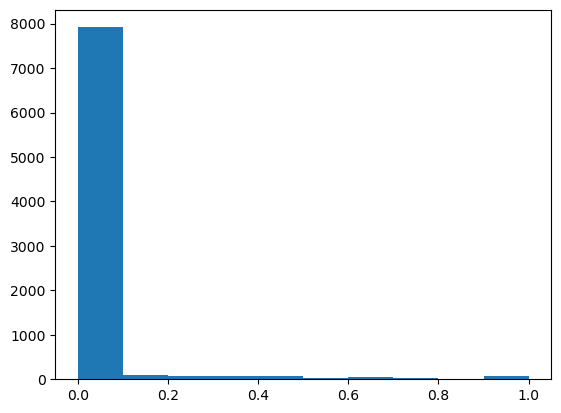

In [58]:
plt.hist(df_toxcast.Predicted)

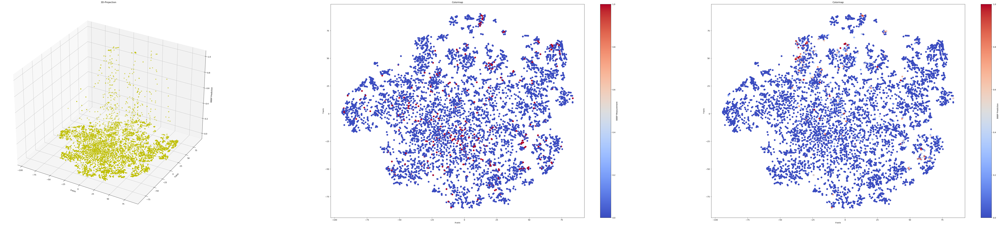

In [61]:
LR = SGDClassifier(loss="modified_huber")
LR.fit(np.array(X_train)[:, 47:], np.array(y_train))

toxcast_ftr = pd.DataFrame({
    'Smiles': [list(x[47:]) for x in df_toxcast.X],
    'Atomic': [list(x[:47]) for x in df_toxcast.X],
    'Predicted': [x[1] for x in LR.predict_proba([x[47:] for x in df_toxcast.X])],
    'label': list(df_toxcast.y)
})

#Draw figure with two subplot

tsne = TSNE(n_components=2, random_state=42)
transformed_data = tsne.fit_transform(np.array(list(toxcast_ftr.Smiles)))

fig = plt.figure(figsize=(100, 20))

ax1 = fig.add_subplot(1, 3, 1, projection='3d')

ax1.scatter(transformed_data[:, 0], transformed_data[:, 1], toxcast_ftr.Predicted, c='y')

ax1.set_title('3D-Projection')
ax1.set_xlabel('X-axis')
ax1.set_ylabel('Y-axis')
ax1.set_zlabel('BBBP Prediction')

ax2 = fig.add_subplot(1, 3, 2)

# 通过颜色表示第三个维度
sc = ax2.scatter(transformed_data[:, 0], transformed_data[:, 1], c=toxcast_ftr.label, vmin=0, vmax=1, cmap='coolwarm', s=60,
                 )

# 添加颜色条
colorbar = fig.colorbar(sc, ax=ax2)
colorbar.set_label('BBBP Measurement')

# 设置坐标轴标签
ax2.set_title('Colormap')
ax2.set_xlabel('X-axis')
ax2.set_ylabel('Y-axis')

ax3 = fig.add_subplot(1, 3, 3)

# 通过颜色表示第三个维度
sc = ax3.scatter(transformed_data[:, 0], transformed_data[:, 1], c=toxcast_ftr.Predicted, cmap='coolwarm', vmin=0, vmax=1, s=60,
                 )

# 添加颜色条
colorbar = fig.colorbar(sc, ax=ax3)
colorbar.set_label('BBBP Prediction')

# 设置坐标轴标签
ax3.set_title('Colormap')
ax3.set_xlabel('X-axis')
ax3.set_ylabel('Y-axis')

# 显示图形
plt.show()

In [58]:
df_sider = pd.read_csv('./data/Sider.csv')
df_sider.X = df_sider.X.apply(lambda x: [eval(n) for n in x[1:-1].split()])

X_train, X_test, y_train, y_test = train_test_split(list(df_sider.X), list(df_sider.y), test_size=0.1, random_state=0)

LR = svm.SVC(kernel='linear')
LR.fit(np.array(X_train)[:, :47], np.array(y_train))
print(LR.score(np.array(X_test)[:, :47], np.array(y_test)))

LR = svm.SVC(kernel='linear')
LR.fit(np.array(X_train)[:, 47:], np.array(y_train))
print(LR.score(np.array(X_test)[:, 47:], np.array(y_test)))

LR = svm.SVC(kernel='linear')
LR.fit(np.array(X_train), np.array(y_train))
print(LR.score(np.array(X_test), np.array(y_test)))

0.5954198473282443
0.5725190839694656
0.549618320610687


In [60]:
df_clintox = pd.read_csv('./data/Clintox.csv')
df_clintox.X = df_clintox.X.apply(lambda x: [eval(n) for n in x[1:-1].split()])

X_train, X_test, y_train, y_test = train_test_split(list(df_clintox.X), list(df_clintox.y), test_size=0.1,
                                                    random_state=0)

LR = svm.SVC(kernel='linear')
LR.fit(np.array(X_train)[:, :47], np.array(y_train))
print(LR.score(np.array(X_test)[:, :47], np.array(y_test)))

LR = svm.SVC(kernel='linear')
LR.fit(np.array(X_train)[:, 47:], np.array(y_train))
print(LR.score(np.array(X_test)[:, 47:], np.array(y_test)))

LR = svm.SVC(kernel='linear')
LR.fit(np.array(X_train), np.array(y_train))
print(LR.score(np.array(X_test), np.array(y_test)))

0.8405797101449275
0.9420289855072463
0.8840579710144928


In [41]:
LR = svm.SVC(kernel='linear', probability=True)
LR.fit(np.array(bbbp_ftr.Smiles), np.array(bbbp_ftr.label))
print(LR.score(np.array(bbbp_ftr.Smiles), np.array(bbbp_ftr.label)))

ValueError: setting an array element with a sequence.

In [2]:
import torch

if torch.backends.mps.is_available():
    mps_device = torch.device("mps")
    x = torch.ones(1, device=mps_device)
    print(x)
else:
    print("MPS device not found.")

tensor([1.], device='mps:0')


In [3]:
df_smile = pd.read_csv('./data/chems_smile_embeds.csv', index_col=0)
df_smile['embd'] = df_smile['embd'].apply(lambda x: [eval(n) for n in x[1:-1].split(',')])
df_smile.head()

,smiles,embd
0,Cc1ncc(N(=O)=O)n1CCO,"[-0.5111304521560669, -0.3780006766319275, -0...."
1,[H]N1[C@]2([H])[C@H]([NH2+][C@@]3([H])C([H])([...,"[-0.35639846324920654, 0.2741997241973877, 0.3..."
2,[H]C(=O)C(=O)C(=O)C([H])=O,"[0.8286118507385254, -0.06698048859834671, 0.2..."
3,[H]O[C@@]1([H])C(N([H])[H])=C([H])C(=O)[C@@]1(...,"[0.026882467791438103, 0.18766936659812927, 0...."
4,[H]C([H])([H])O[C@]1([H])O[C@]([H])(C([H])([H]...,"[0.19433356821537018, 0.5830560922622681, 0.99..."


In [4]:
import deepchem as dc

tasks_1, datasets_1, transformers_1 = dc.molnet.load_delaney(save_dir='./data/delaney')
train_dataset_1, valid_dataset_1, test_dataset_1 = datasets_1

tasks_2, datasets_2, transformers_2 = dc.molnet.load_lipo(save_dir='./data/lipo')
train_dataset_2, valid_dataset_2, test_dataset_2 = datasets_2

tasks_3, datasets_3, transformers_3 = dc.molnet.load_sampl(save_dir='./data/sampl')
train_dataset_3, valid_dataset_3, test_dataset_3 = datasets_3

tasks_4, datasets_4, transformers_4 = dc.molnet.load_bbbp(save_dir='./data/bbbp')
train_dataset_4, valid_dataset_4, test_dataset_4 = datasets_4

tasks_5, datasets_5, transformers_5 = dc.molnet.load_tox21(save_dir='./data/tox21')
train_dataset_5, valid_dataset_5, test_dataset_5 = datasets_5

tasks_6, datasets_6, transformers_6 = dc.molnet.load_toxcast(save_dir='./data/toxcast')
train_dataset_6, valid_dataset_6, test_dataset_6 = datasets_6

tasks_7, datasets_7, transformers_7 = dc.molnet.load_sider(save_dir='./data/sider')
train_dataset_7, valid_dataset_7, test_dataset_7 = datasets_7

tasks_8, datasets_8, transformers_8 = dc.molnet.load_clintox(save_dir='./data/clintox')
train_dataset_8, valid_dataset_8, test_dataset_8 = datasets_8

tasks_9, datasets_9, transformers_9 = dc.molnet.load_qm8(save_dir='./data/qm8')
train_dataset_9, valid_dataset_9, test_dataset_9 = datasets_9

tasks_10, datasets_10, transformers_10 = dc.molnet.load_qm9(save_dir='./data/qm10')
train_dataset_10, valid_dataset_10, test_dataset_10 = datasets_10


No normalization for SPS. Feature removed!
No normalization for AvgIpc. Feature removed!


Error: Unable to import pysam. Please make sure it is installed.
Error: Unable to import pysam. Please make sure it is installed.
Error: Unable to import pysam. Please make sure it is installed.


Skipped loading modules with pytorch-geometric dependency, missing a dependency. No module named 'torch_geometric'
Skipped loading modules with transformers dependency. No module named 'transformers'
cannot import name 'HuggingFaceModel' from 'deepchem.models.torch_models' (/Users/lyu/anaconda3/envs/transKnow/lib/python3.10/site-packages/deepchem/models/torch_models/__init__.py)
Skipped loading modules with pytorch-geometric dependency, missing a dependency. cannot import name 'DMPNN' from 'deepchem.models.torch_models' (/Users/lyu/anaconda3/envs/transKnow/lib/python3.10/site-packages/deepchem/models/torch_models/__init__.py)
Skipped loading modules with pytorch-lightning dependency, missing a dependency. No module named 'lightning'
Skipped loading some Jax models, missing a dependency. No module named 'jax'


In [5]:
df_atm = pd.read_csv('./data/chems_mol_embeds.tsv', sep='\t')
df_atm.head()

,material,0,1,2,3,4,5,6,7,8,...,37,38,39,40,41,42,43,44,45,46
0,C10H16O,-9.375144,-6.252895,-9.450036,-9.463385,-9.431440,-8.192357,0.742655,-2.381039,2.338011,...,-4.232772,-3.524788,-1.617565,-6.296938,-5.855720,-12.192619,-5.967376,1.235345,2.551861,0.560488
1,C5H10,-16.146378,-10.869033,-16.210766,-16.209013,-16.207207,-12.349863,-2.278428,-3.089478,-1.880356,...,-2.061406,-9.821599,-6.689069,-9.476134,-12.998013,-13.089906,-11.023088,-1.946517,0.655809,-8.162992
2,C14H30,-9.655567,-7.714100,-9.755775,-9.611471,-9.653734,-8.590097,2.249515,-4.302223,2.682639,...,-5.226035,-0.468243,1.222938,-6.378024,-5.672376,-18.476187,-5.541743,2.474657,3.754225,5.083788
3,C3H7Cl,-15.843559,-10.797818,-15.938188,-15.937713,-15.954926,-13.093907,-2.496228,-2.515979,-2.255791,...,-7.444685,-11.236151,-9.135277,-8.994360,-11.991519,-12.144553,-11.507240,-6.271641,-3.554595,-10.659878
4,C5H12O,-13.374829,-8.421584,-13.459436,-13.496655,-13.482946,-10.621461,-1.011946,-2.516770,-0.234400,...,-4.228805,-8.627006,-5.650629,-7.678995,-10.201046,-9.917380,-9.234699,-1.702636,0.830891,-6.168801
